In [499]:
import pandas as pd
import numpy as np
from datetime import datetime
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import colors
import seaborn as sns
sns.set_theme(style= 'whitegrid')
import matplotlib.pyplot as plt, numpy as np
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap
from scipy.stats.mstats import winsorize

from sklearn.preprocessing import StandardScaler,normalize
from sklearn.decomposition import PCA

from sklearn.metrics import davies_bouldin_score
from sklearn.metrics import silhouette_score

from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster.hierarchy import single, cophenet
from scipy.spatial.distance import pdist, squareform
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering

from sklearn import mixture

In [500]:
def iqrOutlier(data):
    Q1,Q3=np.percentile(data,[25,75])
    IQR=Q3-Q1
    lower_limit=Q1-(1.5*IQR)
    upper_limit=Q3+(1.5*IQR)
    return(lower_limit,upper_limit)

In [501]:
data_raw = pd.read_csv('data/marketing_campaign.csv',sep='\t')

In [502]:
print(f'Dataset size: {data_raw.shape[0]} and attributes: {data_raw.shape[1]}')

Dataset size: 2240 and attributes: 29


### Attributes

#### People

`ID`: Customer's unique identifier

`Year_Birth`: Customer's birth year

`Education`: Customer's education level

`Marital_Status`: Customer's marital status

`Income`: Customer's yearly household income

`Kidhome`: Number of children in customer's household

`Teenhome`: Number of teenagers in customer's household

`Dt_Customer`: Date of customer's enrollment with the company

`Recency`: Number of days since customer's last purchase

`Complain`: 1 if the customer complained in the last 2 years, 0 otherwise

#### Products

`MntWines`: Amount spent on wine in last 2 years

`MntFruits`: Amount spent on fruits in last 2 years

`MntMeatProducts`: Amount spent on meat in last 2 years

`MntFishProducts`: Amount spent on fish in last 2 years

`MntSweetProducts`: Amount spent on sweets in last 2 years

`MntGoldProds`: Amount spent on gold in last 2 years

#### Promotion

`NumDealsPurchases`: Number of purchases made with a discount

`AcceptedCmp1`: 1 if customer accepted the offer in the 1st campaign, 0 otherwise

`AcceptedCmp2`: 1 if customer accepted the offer in the 2nd campaign, 0 otherwise

`AcceptedCmp3`: 1 if customer accepted the offer in the 3rd campaign, 0 otherwise

`AcceptedCmp4`: 1 if customer accepted the offer in the 4th campaign, 0 otherwise
 
`AcceptedCmp5`: 1 if customer accepted the offer in the 5th campaign, 0 otherwise

`Response`: 1 if customer accepted the offer in the last campaign, 0 otherwise

#### Place

`NumWebPurchases`: Number of purchases made through the company’s website

`NumCatalogPurchases`: Number of purchases made using a catalogue

`NumStorePurchases`: Number of purchases made directly in stores

`NumWebVisitsMonth`: Number of visits to company’s website in the last month

In [503]:
data_raw.head(5)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


In [504]:
data_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [505]:
(data_raw.isna().sum()/len(data_raw))*100

ID                     0.000000
Year_Birth             0.000000
Education              0.000000
Marital_Status         0.000000
Income                 1.071429
Kidhome                0.000000
Teenhome               0.000000
Dt_Customer            0.000000
Recency                0.000000
MntWines               0.000000
MntFruits              0.000000
MntMeatProducts        0.000000
MntFishProducts        0.000000
MntSweetProducts       0.000000
MntGoldProds           0.000000
NumDealsPurchases      0.000000
NumWebPurchases        0.000000
NumCatalogPurchases    0.000000
NumStorePurchases      0.000000
NumWebVisitsMonth      0.000000
AcceptedCmp3           0.000000
AcceptedCmp4           0.000000
AcceptedCmp5           0.000000
AcceptedCmp1           0.000000
AcceptedCmp2           0.000000
Complain               0.000000
Z_CostContact          0.000000
Z_Revenue              0.000000
Response               0.000000
dtype: float64

There are 1.07 % of missing values in the atribute `Income`

In [506]:
data = data_raw.copy()

#Calucalte Total amount spent on all products
data['total_spend'] = data['MntWines']+data['MntFruits']+data['MntMeatProducts']+data['MntFishProducts']+data['MntSweetProducts']+data['MntGoldProds']

# caluclate the customer seniority based on Date of customer enrolled with the company to the latest Dt_Customer (new customer)
data['Dt_Customer'] = pd.to_datetime(data['Dt_Customer'],infer_datetime_format=True,dayfirst=True)
data['Seniority'] = pd.to_numeric(data['Dt_Customer'].dt.date.apply(lambda x: (data['Dt_Customer'].max().date() - x)).dt.days, downcast='integer')/30

#Calucate Age from Year_Birth 
data['Age'] = data['Dt_Customer'].max().year - data['Year_Birth']

# rename columns
data=data.rename(columns={'NumWebPurchases': "Web",'NumCatalogPurchases':'Catalog','NumStorePurchases':'Store','MntWines': "Wines",'MntFruits':'Fruits','MntMeatProducts':'Meat','MntFishProducts':'Fish','MntSweetProducts':'Sweets','MntGoldProds':'Gold'})

#rename categories for the attributes Marital_Status and Education
data['Marital_Status']=data['Marital_Status'].replace({'Divorced':'Alone','Single':'Alone','Married':'couple','Together':'couple','Absurd':'Alone','Widow':'Alone','YOLO':'Alone'})
data['Education']=data['Education'].replace({'Basic':'Undergraduate','2n Cycle':'Undergraduate','Graduation':'Graduate','Master':'Postgraduate','PhD':'Postgraduate'})

#Create a feaure for childern and if they are parent
data['Children']=data['Kidhome']+data['Teenhome']
data['Is_Parent'] = np.where(data.Children> 0, 1, 0)
data["Family_Size"] = data["Marital_Status"].replace({"Alone": 1, "couple":2})+ data["Children"]

data ['TotalAcceptedCmp'] = data['AcceptedCmp1'] + data['AcceptedCmp2'] + data['AcceptedCmp3'] + data['AcceptedCmp4']+ data['AcceptedCmp5']


data = data.drop(columns=["Dt_Customer", "Z_CostContact", "Z_Revenue", "Year_Birth", "ID"], axis=1)

Since we want to segment all customers, so we are not dropping the missing values instead Imputing missed values of `Income`, with Median income  on `Education`, we can also groupby income on Education and age

In [507]:
data.loc[data['Income'].isna(),'Income']=data['Education'].map(data.groupby(['Education'])['Income'].median().to_dict())

In [508]:
data.describe()

,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,Gold,...,AcceptedCmp2,Complain,Response,total_spend,Seniority,Age,Children,Is_Parent,Family_Size,TotalAcceptedCmp
count,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,...,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000
mean,52233.029687,0.444196,0.506250,49.109375,303.935714,26.302232,166.950000,37.525446,27.062946,44.021875,...,0.013393,0.009375,0.149107,605.798214,11.786071,45.194196,0.950446,0.715179,2.595089,0.297768
std,25044.976734,0.538398,0.544538,28.962453,336.597393,39.773434,225.715373,54.628979,41.280498,52.167439,...,0.114976,0.096391,0.356274,602.249288,6.737417,11.984069,0.751803,0.451430,0.906959,0.678381
min,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,5.000000,0.000000,18.000000,0.000000,0.000000,1.000000,0.000000
25%,35538.750000,0.000000,0.000000,24.000000,23.750000,1.000000,16.000000,3.000000,1.000000,9.000000,...,0.000000,0.000000,0.000000,68.750000,6.025000,37.000000,0.000000,0.000000,2.000000,0.000000
50%,51609.500000,0.000000,0.000000,49.000000,173.500000,8.000000,67.000000,12.000000,8.000000,24.000000,...,0.000000,0.000000,0.000000,396.000000,11.850000,44.000000,1.000000,1.000000,3.000000,0.000000
75%,68289.750000,1.000000,1.000000,74.000000,504.250000,33.000000,232.000000,50.000000,33.000000,56.000000,...,0.000000,0.000000,0.000000,1045.500000,17.633333,55.000000,1.000000,1.000000,3.000000,0.000000
max,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,263.000000,362.000000,...,1.000000,1.000000,1.000000,2525.000000,23.300000,121.000000,3.000000,1.000000,5.000000,4.000000


<Figure size 576x396 with 0 Axes>

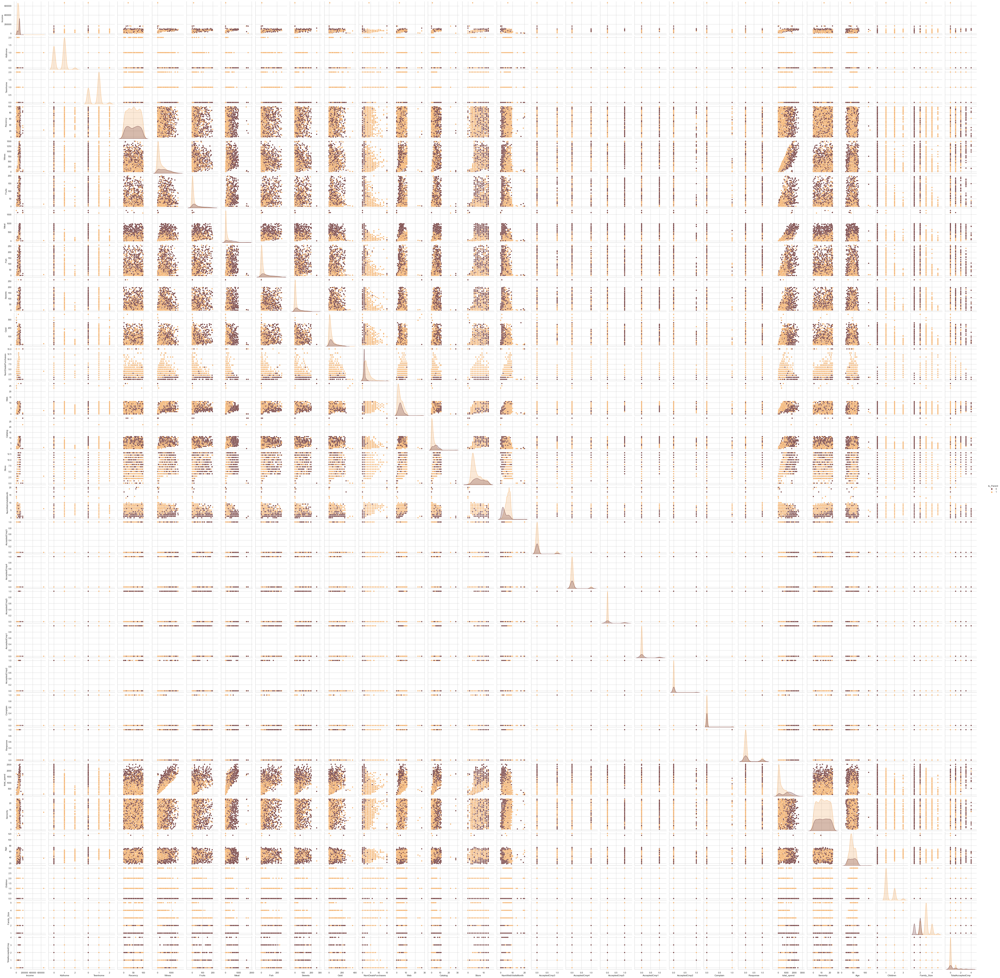

In [206]:
pallet = ["#682F2F", "#9E726F", "#D6B2B1", "#B9C0C9", "#9F8A78", "#F3AB60"]
cmap = colors.ListedColormap(["#682F2F", "#9E726F", "#D6B2B1", "#B9C0C9", "#9F8A78", "#F3AB60"])
plt.figure()
sns.pairplot(data, hue= "Is_Parent",palette= (["#682F2F","#F3AB60"]))
plt.show();

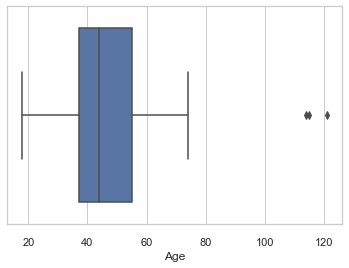

In [509]:
plt.figure(figsize=(6,4))
sns.boxplot(x='Age',data=data,orient='h');

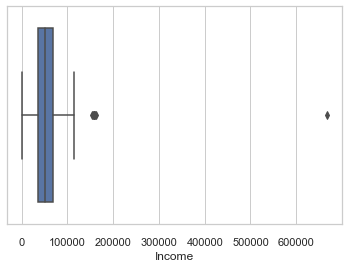

In [510]:
plt.figure(figsize=(6,4))
sns.boxplot(x='Income',data=data,orient='h');

### outlier Handling

We can see that there are outliers in `Age` and `Income`, capping the outliers with upper limit of IQR method

In [511]:
ll,ul = iqrOutlier(data['Age'])
data.loc[data['Age']>ul,'Age'] = ul

In [512]:
ll,ul = iqrOutlier(data['Income'])
data.loc[data['Income']>ul,'Income'] = ul

### Correlation matrix

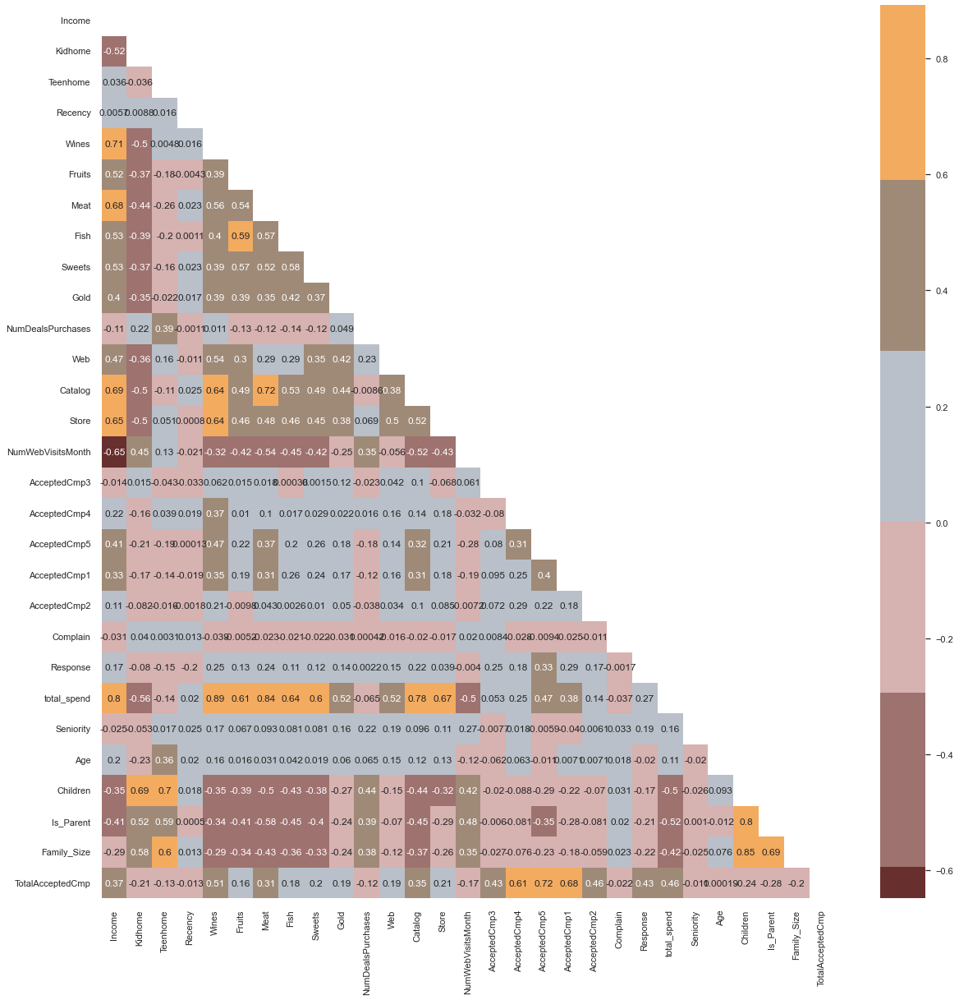

In [513]:
corr_mtrx= data.corr()
matrix = np.triu(corr_mtrx)

plt.figure(figsize=(20,20))  
sns.heatmap(corr_mtrx,annot=True, cmap=cmap, center=0,mask=matrix);

From the correlation chart, we can observe that there is an Multicollinearity, where features are correlated with each other

### One Hot Encoding of Categorical Variables

In [514]:
print(data.select_dtypes(exclude='number').columns)
data = pd.get_dummies(data)

Index(['Education', 'Marital_Status'], dtype='object')


### Data Transformation - Standardization

	• Standardization is more beneficial than normalization for Unsupervised Learning.
	• If  dataset has extremely high or low values (outliers) then standardization is more preferred because usually, normalization will compress these values into a small range.

In [515]:
def standardTransform(data):
    scaler = StandardScaler()
    scaler.fit(data)
    data_ss = pd.DataFrame(scaler.transform(data),columns= data.columns)
    return data_ss

In [516]:
data_ss = standardTransform(data)
data_ss.head()

,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,Gold,...,Age,Children,Is_Parent,Family_Size,TotalAcceptedCmp,Education_Graduate,Education_Postgraduate,Education_Undergraduate,Marital_Status_Alone,Marital_Status_couple
0,0.299768,-0.825218,-0.929894,0.307039,0.983781,1.551577,1.679702,2.462147,1.476500,0.843207,...,1.007064,-1.264505,-1.584605,-1.759115,-0.439037,0.993769,-0.786446,-0.360002,1.346874,-1.346874
1,-0.263467,1.032559,0.906934,-0.383664,-0.870479,-0.636301,-0.713225,-0.650449,-0.631503,-0.729006,...,1.261969,1.396361,0.631072,0.446548,-0.439037,0.993769,-0.786446,-0.360002,1.346874,-1.346874
2,0.943282,-0.825218,-0.929894,-0.798086,0.362723,0.570804,-0.177032,1.345274,-0.146905,-0.038766,...,0.327318,-1.264505,-1.584605,-0.656283,-0.439037,0.993769,-0.786446,-0.360002,-0.742460,0.742460
3,-1.204166,1.032559,-0.929894,-0.798086,-0.870479,-0.560857,-0.651187,-0.503974,-0.583043,-0.748179,...,-1.287080,0.065928,0.631072,0.446548,-0.439037,0.993769,-0.786446,-0.360002,-0.742460,0.742460
4,0.307171,1.032559,-0.929894,1.550305,-0.389085,0.419916,-0.216914,0.155164,-0.001525,-0.556446,...,-1.032175,0.065928,0.631072,0.446548,-0.439037,-1.006270,1.271543,-0.360002,-0.742460,0.742460


### Dimensionality Reduction with Principal Component Analysis

#### Steps involved in PCA

    Standardize the data.
    Calculate the covariance matrix.
    Find the eigenvalues and eigenvectors for the covariance matrix.
    Plot the vectors on the scaled data.

In [517]:
def pcaComponenets(data,var):
    pca = PCA(n_components = var)
    pca_features = pca.fit_transform(data)
    pca.explained_variance_
    #print(np.cumsum(pca.explained_variance_ratio_))
    df_pca = pd.DataFrame(pca_features)
    df_pca.columns = [f'pca_{i+1}' for i in df_pca.columns]
    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20,6))
    #fig.suptitle('Explained Variance with Principal Components')
    ax1.plot(np.cumsum(pca.explained_variance_ratio_))
    ax1.set(xlabel='Number of PCA', ylabel='Cummulative Explained Variance')
    ax1.set_title('Cummulative Explained Variance plot')
    ax2.plot(pca.explained_variance_)
    ax2.set(xlabel='Number of PCA', ylabel='Explained Variance')
    ax2.set_title('Explained Variance plot')
    fig.tight_layout();
    return df_pca

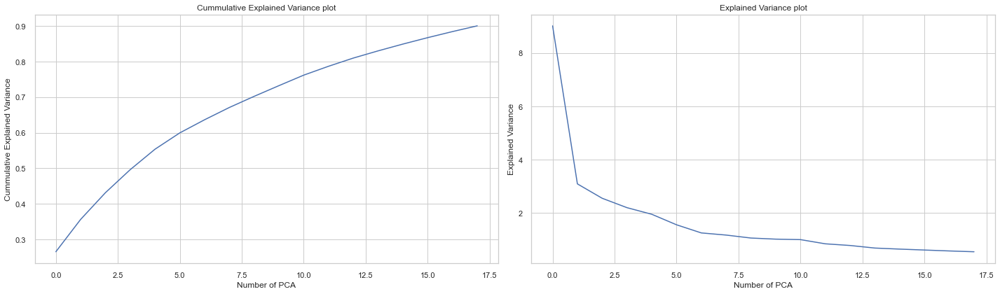

In [518]:
df_pca = pcaComponenets(data_ss,0.90)

## Clustering

### Evaluation Metrics

#### Davies-Bouldin score.

The score is defined as the average similarity measure of each cluster with its most similar cluster, where similarity is the ratio of within-cluster distances to between-cluster distances. Thus, clusters which are farther apart and less dispersed will result in a better score.

The minimum score is `zero`, with lower values indicating better clustering.

#### Silhouette Score: 
	The silhouette value is a measure of how similar an object is to its own cluster (cohesion) compared to other clusters (separation).
	The silhouette score is calculated utilizing the mean intra- cluster distance between points, AND the mean nearest-cluster distance. For instance, a cluster with a lot of data points very close to each other (high density) AND is far away from the next nearest cluster (suggesting the cluster is very unique in comparison to the next closest), will have a strong silhouette score.

 A silhouette score ranges from `-1 to 1`, with -1 being the worst score possible and 1 being the best score. Silhouette scores of 0 suggest overlapping clusters.

### K-Means

objective of the K-Means algorithm is to minimize the sum of distances between the points and their respective cluster centroid

In [217]:
def kmeansCluster(mi,mx,data):
    K = range(mi,mx)
    inertia = []
    score = {}
    for n in K:
        kmean = KMeans(n_clusters = n, init = 'k-means++',max_iter = 300, n_init = 10, random_state = 0)
        kmean.fit_predict(data)
        inertia.append(kmean.inertia_)
        labels = kmean.labels_
        score[n] = {'Davis_Boulden':davies_bouldin_score(data,labels),'Silhouette_Score': silhouette_score(data,labels)}
    score_df = pd.DataFrame(score).T
    print(f"{score_df.to_markdown()}\n")
    print(f"Max Silhoutte Score: {score_df['Silhouette_Score'].max()} for the cluster : {score_df['Silhouette_Score'].idxmax()}")
    print(f"Min Davies Bouldin Score: {score_df['Davis_Boulden'].min()} for the cluster : {score_df['Davis_Boulden'].idxmin()}")
    plt.figure(figsize=(8,6))
    plt.plot(K,inertia,'bx-')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Inertia')
    plt.title('Elbow Method for optimal K')
    plt.show()
    print('Elbow Method to determine the number of clusters')
    Elbow_M = KElbowVisualizer(KMeans(), k=mx)
    Elbow_M.fit(data)
    Elbow_M.show();

### Elbow Method on Standardised PCA Data

|    |   Davis_Boulden |   Silhouette_Score |
|---:|----------------:|-------------------:|
|  2 |         1.89115 |          0.229553  |
|  3 |         2.18816 |          0.152752  |
|  4 |         2.18745 |          0.152893  |
|  5 |         2.20985 |          0.11668   |
|  6 |         2.11837 |          0.107651  |
|  7 |         2.08611 |          0.10472   |
|  8 |         2.19682 |          0.096489  |
|  9 |         2.1318  |          0.0967687 |

Max Silhoutte Score: 0.22955265421809362 for the cluster : 2
Min Davies Bouldin Score: 1.8911495928953008 for the cluster : 2


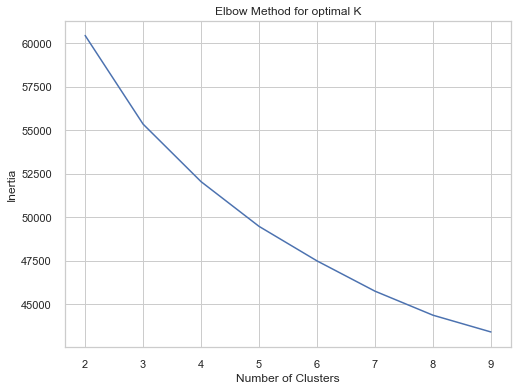

Elbow Method to determine the number of clusters


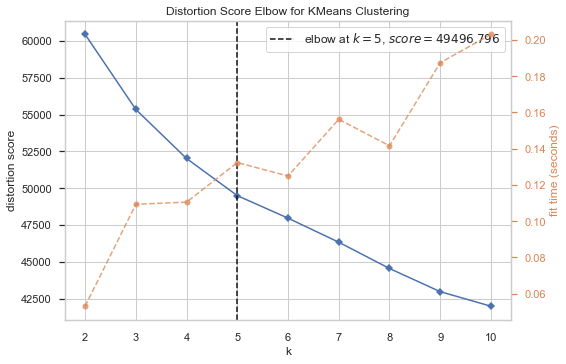

In [218]:
kmeansCluster(2,10,df_pca)

|    |   Davis_Boulden |   Silhouette_Score |
|---:|----------------:|-------------------:|
|  2 |         1.30043 |           0.315807 |
|  3 |         1.32776 |           0.259634 |
|  4 |         1.40267 |           0.258362 |
|  5 |         1.23855 |           0.258019 |
|  6 |         1.16267 |           0.265153 |
|  7 |         1.1623  |           0.257107 |
|  8 |         1.14452 |           0.261928 |
|  9 |         1.10873 |           0.260442 |

Max Silhoutte Score: 0.3158065115616576 for the cluster : 2
Min Davies Bouldin Score: 1.108734737775699 for the cluster : 9


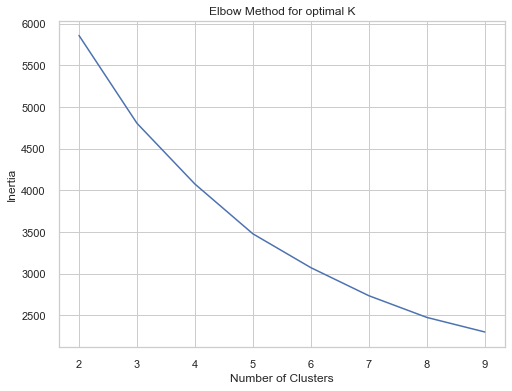

Elbow Method to determine the number of clusters


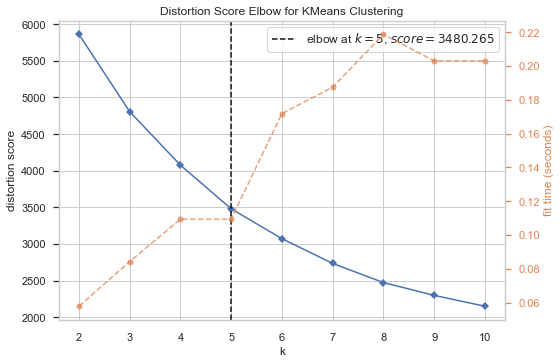

In [549]:
kmeansCluster(2,10,d_ss)

Elbow Method Suggests `5 Clusters` but the Davies-Boulden score and Sihouette score for K-means are poor and they suggest `2 clusters`, so let try with other Clustering Algorithms

#### data with reduced attributes

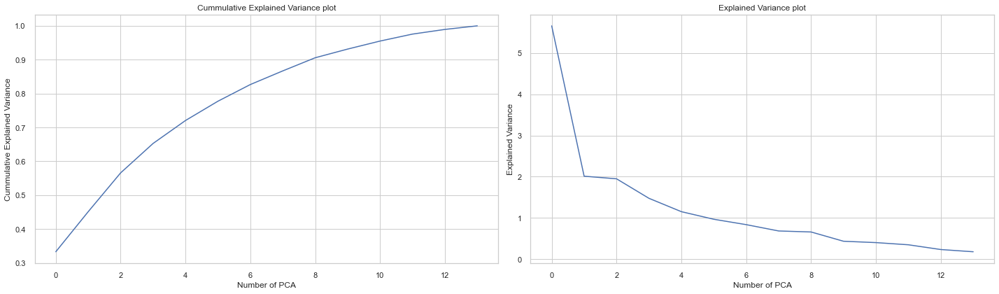

In [219]:
deals_attr = ['AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1','AcceptedCmp2', 'Complain', 'Response','TotalAcceptedCmp']
#sub_df = data.drop(columns=deals_attr)
sub_df = data[['Age','Education_Graduate','Education_Postgraduate', 'Education_Undergraduate','Marital_Status_Alone', 'Marital_Status_couple','Income','total_spend','Seniority','Is_Parent','Children','Wines','Fruits','Meat','Fish','Sweets','Gold']]

sub_df_ss = standardTransform(sub_df)
sub_df_pca = pcaComponenets(sub_df_ss,0.99)

### Agglomerative Hierarchical Clustering

##### Cophenetic Coefficient
Visually looking into every dendrogram to determine which clustering linkage works best is challenging and requires a lot of manual effort. To overcome this we introduce the concept of Cophenetic Coefficient.

Imagine two Clusters, A and B with points A₁, A₂, and A₃ in Cluster A and points B₁, B₂, and B₃ in cluster B. Now for these two clusters to be well-separated points A₁, A₂, and A₃ and points B₁, B₂, and B₃ should be far from each other as well. Cophenet index is a measure of the correlation between the distance of points in feature space and distance on the dendrogram. It usually takes all possible pairs of points in the data and calculates the euclidean distance between the points. (remains the same, irrespective of which linkage algorithm we chose). It then computes the dendrogram distance at which clusters A & B combines. If the distance between these points increases with the dendrogram distance between the clusters then the Cophenet index is closer to 1.



In [323]:
def dendogramPlot(data):
    clusters = sch.linkage(data, method='ward', metric="euclidean")
    c, coph_dists = cophenet(clusters, pdist(data))
    print(c)
    plt.figure(figsize=(26,8))
    plt.title("Dendrogram")
    shc.dendrogram(Z=clusters)
    plt.show()
    
def dendogramPlotCophent(data):
    method = ['single','complete','average','weighted','centroid','median','ward']
    method_dct = {}
    for i in method:
        clusters = sch.linkage(data, method = i, metric="euclidean")
        c, coph_dists = cophenet(clusters, pdist(data))
        method_dct[i] = c
    method_df = pd.DataFrame([method_dct]).T.rename(columns={0:'cophentic'})
    print(method_df.to_markdown())
    link_mtd = method_df['cophentic'].idxmax()
    print(f"\nMax Cophentic Score is: {method_df['cophentic'].max()} for the Linkage method: {link_mtd}")
    plt.figure(figsize=(26,8))
    plt.title("Dendrogram")
    clusters = sch.linkage(data, method = link_mtd, metric="euclidean")
    shc.dendrogram(Z=clusters)
    plt.show()

def agglClustering(mi,mx,data,lm):
    K = range(mi,mx)
    score ={}
    for i in K:
        ahc = AgglomerativeClustering(n_clusters=i,linkage = lm)
        labels = ahc.fit_predict(data)
        score[i] = {'Davis_Boulden':davies_bouldin_score(data,labels),'Silhouette_Score': silhouette_score(data,labels)}
    score_df = pd.DataFrame(score).T
    print(f"{score_df.to_markdown()}\n")
    print(f"Max Silhoutte Score: {score_df['Silhouette_Score'].max()} for the cluster : {score_df['Silhouette_Score'].idxmax()}")
    print(f"Min Davies Bouldin Score: {score_df['Davis_Boulden'].min()} for the cluster : {score_df['Davis_Boulden'].idxmin()}")

0.6004332108218364


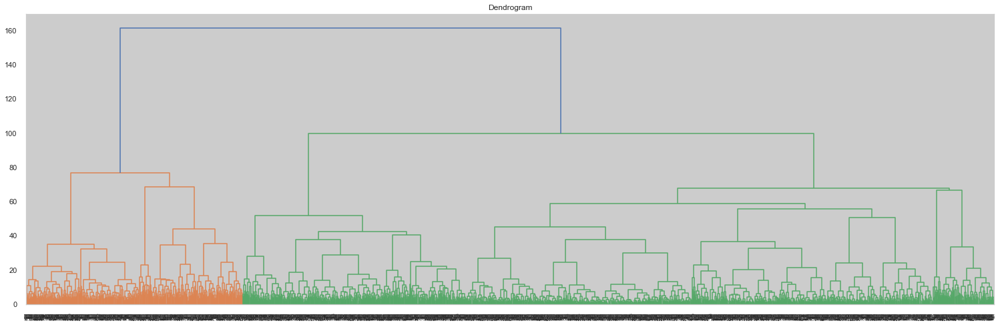

In [221]:
dendogramPlot(df_pca)

Dendogram Suggests `2 clusters`

In [222]:
agglClustering(2,10,df_pca,'ward')

|    |   Davis_Boulden |   Silhouette_Score |
|---:|----------------:|-------------------:|
|  2 |         1.86732 |          0.256938  |
|  3 |         2.40811 |          0.127988  |
|  4 |         2.38529 |          0.130289  |
|  5 |         2.1733  |          0.138481  |
|  6 |         2.12807 |          0.148426  |
|  7 |         1.90083 |          0.15707   |
|  8 |         2.08371 |          0.0842507 |
|  9 |         1.97982 |          0.0935313 |

Max Silhoutte Score: 0.2569376054399095 for the cluster : 2
Min Davies Bouldin Score: 1.8673223933688943 for the cluster : 2


0.5770475974328987


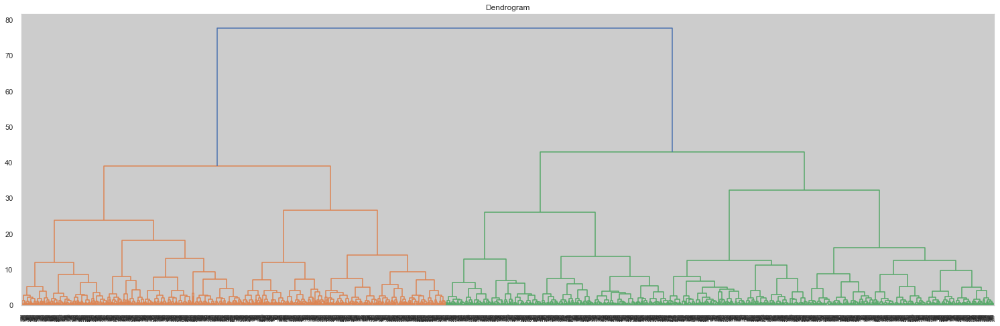

In [559]:
dendogramPlot(d_ss)

In [550]:
agglClustering(2,10,d_ss,'ward')

|    |   Davis_Boulden |   Silhouette_Score |
|---:|----------------:|-------------------:|
|  2 |         1.33117 |           0.304087 |
|  3 |         1.35409 |           0.238662 |
|  4 |         1.48751 |           0.233066 |
|  5 |         1.35724 |           0.21885  |
|  6 |         1.23806 |           0.21631  |
|  7 |         1.20807 |           0.207773 |
|  8 |         1.28254 |           0.213716 |
|  9 |         1.2386  |           0.216983 |

Max Silhoutte Score: 0.30408680303358887 for the cluster : 2
Min Davies Bouldin Score: 1.208074743130505 for the cluster : 7


###  Gaussian Mixture Models

GMMs are a generalization of Gaussian distributions and can be used to represent any data set that can be clustered into multiple Gaussian distributions. The Gaussian mixture model is a probabilistic model that assumes all the data points are generated from a mix of Gaussian distributions with unknown parameters. 

Gaussian mixture models are also relatively robust to outliers, meaning that they can still yield accurate results even if there are some data points that do not fit neatly into any of the clusters

Gaussian Mixture Models (GMMs) assume that there are a certain number of Gaussian distributions, and each of these distributions represent a cluster. Hence, a Gaussian Mixture Model tends to group the data points belonging to a single distribution together.

##### Algorithm

    * Initialize the mean μk, the covariance matrix Σk and the mixing coefficients πk by some random values(or other values).
    * Compute the Ck values for all k.
    * Again Estimate all the parameters using the current C_k values.
    * Compute log-likelihood function.
    * Put some convergence criterion
    * If the log-likelihood value converges to some value (or if all the parameters converge to some values) then stop, else return to Step 2.


In [313]:
d = data[['Income', 'Recency', 'Wines', 'Fruits', 'Meat','Fish', 'Sweets', 'Gold', 'NumDealsPurchases', 'Web', 'Catalog',
 'Store', 'NumWebVisitsMonth','total_spend', 'Seniority', 'Age', 'Children']]
d_ss = standardTransform(d)

In [314]:
def gmm(data):
    n_components = np.arange(2, 30)
    data = normalize(data,norm ='l2')
    score = {}
    for n in n_components:
        models = mixture.GaussianMixture(n_components=n, covariance_type='full', random_state=0).fit(data)
        labels = models.fit_predict(data)
        score[n] = {'Davis_Boulden':davies_bouldin_score(data,labels),'Silhouette_Score': silhouette_score(data,labels),'BIC':models.bic(data),'AIC':models.aic(data)}
    score_df = pd.DataFrame(score).T
    print(f"Max Silhoutte Score: {score_df['Silhouette_Score'].max()} for the cluster : {score_df['Silhouette_Score'].idxmax()}")
    print(f"Min Davies Bouldin Score: {score_df['Davis_Boulden'].min()} for the cluster : {score_df['Davis_Boulden'].idxmin()}")
    print(f"Min BIC Score: {score_df['BIC'].min()} for the cluster : {score_df['BIC'].idxmin()}")
    print(f"Min AIC Score: {score_df['AIC'].min()} for the cluster : {score_df['AIC'].idxmin()}\n")
    print(score_df.to_markdown())
    bic_lst  = score_df['BIC'].values.tolist()
    aic_lst  = score_df['AIC'].values.tolist()
    plt.figure(figsize=(20,6))
    plt.plot(n_components, (bic_lst), label='BIC')
    plt.plot(n_components, (aic_lst), label='AIC')
    plt.legend(loc='best')
    plt.xlabel('n_components');

Max Silhoutte Score: 0.16857549165077163 for the cluster : 2
Min Davies Bouldin Score: 2.073410496627439 for the cluster : 20
Min BIC Score: -351630.0400201486 for the cluster : 7
Min AIC Score: -411441.4878689732 for the cluster : 25

|    |   Davis_Boulden |   Silhouette_Score |     BIC |     AIC |
|---:|----------------:|-------------------:|--------:|--------:|
|  2 |         2.10396 |          0.168575  | -283909 | -291103 |
|  3 |         2.34565 |          0.153151  | -290247 | -301042 |
|  4 |         2.62329 |          0.102586  | -310026 | -324420 |
|  5 |         2.42402 |          0.125541  | -302152 | -320146 |
|  6 |         2.41862 |          0.104443  | -340280 | -361874 |
|  7 |         2.89517 |          0.0306421 | -351630 | -376824 |
|  8 |         2.8126  |          0.0753386 | -345892 | -374686 |
|  9 |         2.67435 |          0.0889878 | -344344 | -376738 |
| 10 |         2.4084  |          0.0966379 | -347523 | -383517 |
| 11 |         2.55406 |          0.07

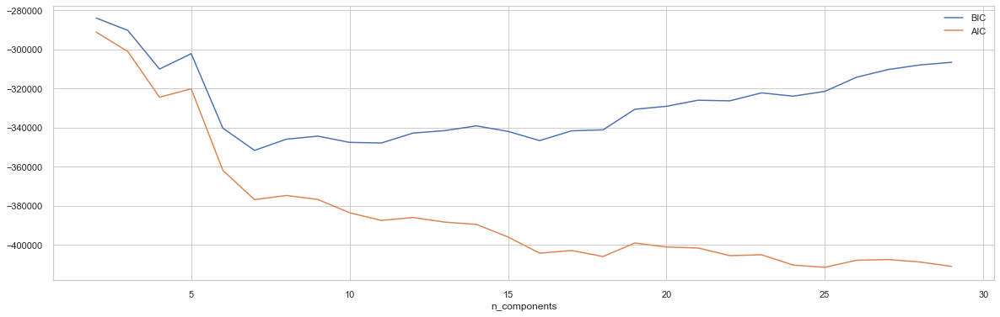

In [316]:
gmm(data_ss)

Max Silhoutte Score: 0.3322627655248602 for the cluster : 2
Min Davies Bouldin Score: 0.9804636012695082 for the cluster : 8
Min BIC Score: 3296.4376704175183 for the cluster : 29
Min AIC Score: 816.4613535530154 for the cluster : 29

|    |   Davis_Boulden |   Silhouette_Score |     BIC |      AIC |
|---:|----------------:|-------------------:|--------:|---------:|
|  2 |        1.32963  |           0.332263 | 9275.17 | 9109.45  |
|  3 |        1.28157  |           0.297844 | 8737.81 | 8486.39  |
|  4 |        1.02044  |           0.284439 | 7788.98 | 7451.84  |
|  5 |        1.12434  |           0.279662 | 7260.15 | 6837.29  |
|  6 |        1.03493  |           0.304265 | 6796.29 | 6287.72  |
|  7 |        1.00702  |           0.295779 | 6264.95 | 5670.67  |
|  8 |        0.980464 |           0.303206 | 5853.28 | 5173.28  |
|  9 |        1.04488  |           0.282126 | 5516.83 | 4751.13  |
| 10 |        1.20939  |           0.272863 | 5251.32 | 4399.9   |
| 11 |        1.12294  |    

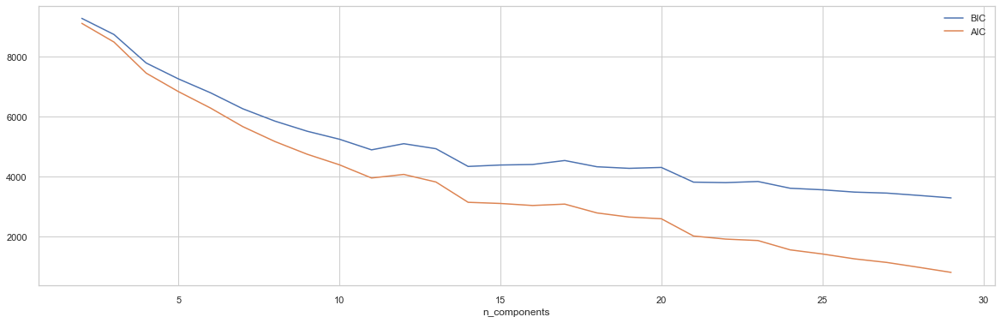

In [551]:
gmm(d_ss)

### Cluster Profiling

In [420]:
d = data[['Income','Recency','total_spend','Seniority']]

In [552]:
d_ss = standardTransform(d)
#d_pca = pcaComponenets(d_ss,0.9)
d_pca = d_ss.copy()
kmean = KMeans(n_clusters = 5, init = 'k-means++',max_iter = 300, n_init = 10, random_state = 0)
data_raw['k_cl']  = kmean.fit_predict(d_pca)

mac = AgglomerativeClustering(n_clusters=5,linkage = 'ward')
data_raw['a_cl'] = mac.fit_predict(d_pca)


gm_models = mixture.GaussianMixture(n_components=5, covariance_type='full', random_state=0).fit(d_pca)
data_raw['g_cl'] = gm_models.fit_predict(d_pca)



<AxesSubplot:xlabel='Clusters', ylabel='count'>

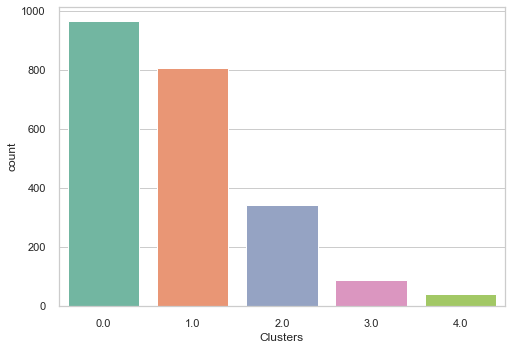

In [553]:
data_raw["Clusters"] = data_raw[['k_cl','a_cl','g_cl']].mode(axis=1)[0]
sns.countplot(x=data_raw["Clusters"], palette= 'Set2')

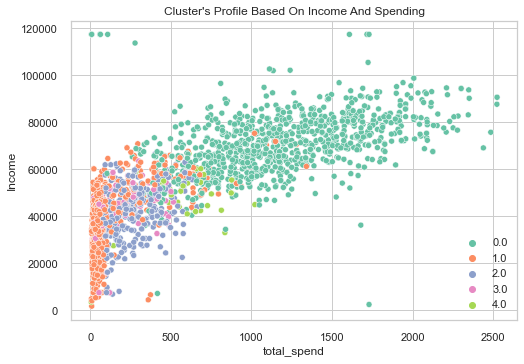

In [554]:
sns.color_palette("tab10")
pl = sns.scatterplot(data = data,x=data["total_spend"], y=data["Income"],hue=data_raw["Clusters"],palette='Set2')
pl.set_title("Cluster's Profile Based On Income And Spending")
plt.legend()
plt.show()

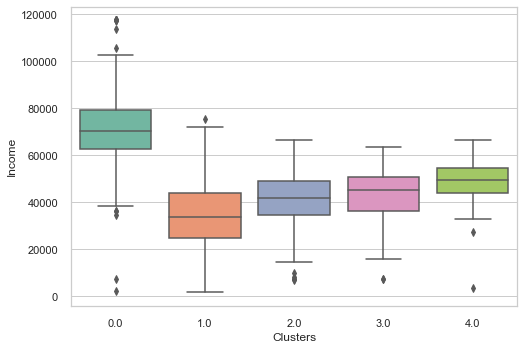

In [555]:
plt.figure()

pl=sns.boxplot(x=data_raw["Clusters"], y=data["Income"], palette='Set2')
plt.show()

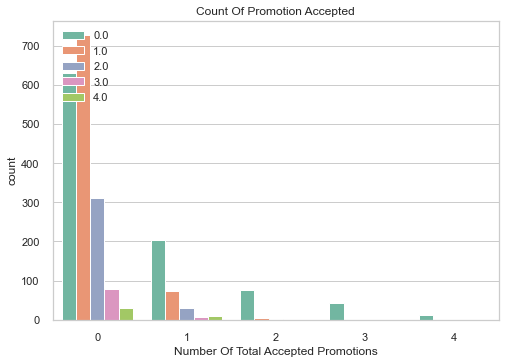

In [558]:
#Creating a feature to get a sum of accepted promotions 
data_raw["Total_Promos"] = data_raw["AcceptedCmp1"]+ data_raw["AcceptedCmp2"]+ data_raw["AcceptedCmp3"]+ data_raw["AcceptedCmp4"]+ data_raw["AcceptedCmp5"]
#Plotting count of total campaign accepted.
plt.figure()
pl = sns.countplot(x=data_raw["Total_Promos"],hue=data_raw["Clusters"], palette= 'Set2')
pl.set_title("Count Of Promotion Accepted")
pl.set_xlabel("Number Of Total Accepted Promotions")
plt.legend()
plt.show()

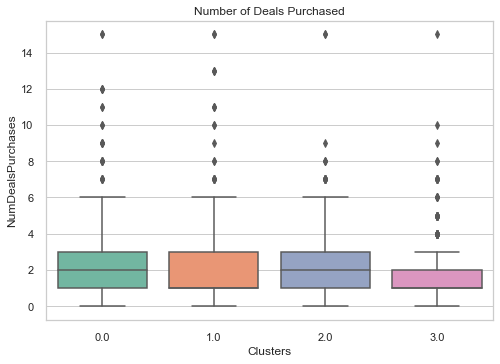

In [540]:
pl=sns.boxplot(y=data["NumDealsPurchases"],x=data_raw["Clusters"], palette= 'Set2')
pl.set_title("Number of Deals Purchased")
plt.show()

https://www.kaggle.com/code/karnikakapoor/customer-segmentation-clustering/notebook#DIMENSIONALITY-REDUCTION


https://thecleverprogrammer.com/2021/02/08/customer-personality-analysis-with-python/


https://www.kaggle.com/code/ryanluoli2/a-complete-guide-to-clustering-methods


https://www.kaggle.com/code/alisultanov/clustering-customer-personality-analysis


https://www.kaggle.com/code/meisamraz/customer-segmentation-clustering-eda-report


https://www.kaggle.com/code/rohitshirudkar/complete-customer-segmentation-pca-k-means


https://www.kaggle.com/code/rohitshirudkar/customer-personality-analysis-with-deployment